#### Inferencia LLM

In [ ]:
import cv2
import base64
import os
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI
from langchain.schema import HumanMessage, SystemMessage
import httpx
import json

# 1. Carga el modelo y las credenciales
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

llm = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0,
    seed=42,  
    api_key=api_key,
    http_client=httpx.Client(verify=False)
)


# JSON a analizar para generar un reporte
datos_deteccion = {
    "fecha": "2025-09-20",
    "ubicacion": "Plaza Central, Ciudad de Ejemplo",
    "personas_detectadas": 1247,
    "tiempo_promedio_permanencia_min": 12.5,
    "horas_pico": [
        {
            "hora": "12:00-13:00",
            "personas": 250
        },
        {
            "hora": "17:00-18:00",
            "personas": 310
        }
    ],
    "personas_reincidentes": 187,
    "comparacion_dia_anterior": {
        "personas_detectadas": 1175,
        "variacion_porcentual": 6.13
    }
}

# Construir el prompt 
prompt = f"""
Actúa como un asistente experto en análisis de datos para ciudades inteligentes.

Tengo un conjunto de datos en formato JSON que contiene información sobre la detección de personas en una plaza pública. La audiencia para este resumen es una persona de la municipalidad que no tiene conocimientos técnicos. Quiero que extraigas los puntos más importantes y los presentes de forma clara, breve y enfocada en la toma de decisiones públicas.

Aquí están los datos:

{json.dumps(datos_deteccion, indent=2)}

Por favor, genera un resumen claro, objetivo y directo que pueda ser leído por alguien del municipio que busca entender la situación en la plaza y tomar decisiones informadas.
"""

# Realizar la Petición 
respuesta = llm.invoke(prompt)

# Mostrar el Resultado 
print("Resumen generado para el municipio:")
print("\n" + respuesta.content)


Resumen generado para el municipio:

**Resumen de Detección de Personas en la Plaza Central - 20 de Septiembre de 2025**

- **Ubicación:** Plaza Central, Ciudad de Ejemplo
- **Total de Personas Detectadas:** 1,247
- **Tiempo Promedio de Permanencia:** 12.5 minutos

**Horarios de Mayor Afluencia:**
- **12:00 - 13:00:** 250 personas
- **17:00 - 18:00:** 310 personas (hora pico)

**Reincidencia:**
- **Personas Reincidentes:** 187 (individuos que visitaron la plaza más de una vez en el día)

**Comparación con el Día Anterior:**
- **Personas Detectadas el Día Anterior:** 1,175
- **Variación:** Aumento del 6.13%

**Conclusiones para la Toma de Decisiones:**
1. **Aumento de Visitantes:** La plaza ha visto un incremento en la afluencia de personas en comparación con el día anterior, lo que puede indicar un interés creciente en el espacio público.
2. **Horarios Clave:** Las horas pico identificadas pueden ser cruciales para planificar actividades, eventos o la asignación de recursos (como segur

In [4]:
respuesta.usage_metadata

{'input_tokens': 291,
 'output_tokens': 349,
 'total_tokens': 640,
 'input_token_details': {'audio': 0, 'cache_read': 0},
 'output_token_details': {'audio': 0, 'reasoning': 0}}

### 1. Analizar una imagen


# Análisis de la Imagen

**Imagen Analizada:**

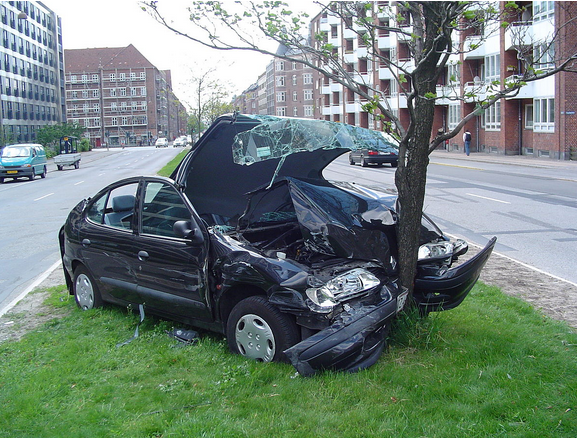

---

**Resultado del Análisis:**

La imagen muestra un automóvil negro que ha sufrido un accidente. El coche está chocado contra un árbol, con el capó levantado y el parabrisas roto. La parte delantera del vehículo parece estar bastante dañada, lo que indica un impacto significativo. El entorno incluye edificios y una calle, lo que sugiere que el accidente ocurrió en un área urbana. La escena puede reflejar un incidente de tráfico que resultó en daños materiales considerables.


In [ ]:
import cv2
import base64
import os
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI
from langchain.schema import HumanMessage, SystemMessage
import httpx
from IPython.display import display, Markdown 


# 1. Cargar el modelo y las credenciales
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

llm = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0,
    seed=42,
    api_key=api_key,
    http_client=httpx.Client(verify=False)
)


# Funcion para codigicar la imagen en base64
def encode_image(image_path):
    """Encodes an image to a base64 string."""
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

# Funcion que recibe la imagen y llama al modelo
def analyze_image(image_path):
    """Analyzes a single image and returns the content."""
    b64_image = encode_image(image_path)

    messages = [
        SystemMessage(content="Eres un asistente que analiza imágenes y detecta anomalías."),
        HumanMessage(content=[
            {"type": "text", "text": "Analiza esta imagen:"},
            {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{b64_image}"}}
        ])
    ]

    response = llm.invoke(messages)
    return response.content


image_path = "../public/vllm_auto_chocado.png"

# 1. Analizar la imagen
analysis_text = analyze_image(image_path)

# Convertir imagen a base64 para incrustarla directamente
b64_image_for_md = encode_image(image_path)

markdown_content = f"""
# Análisis de la Imagen

**Imagen Analizada:**

<img src="data:image/png;base64,{b64_image_for_md}" width="400"/>

---

**Resultado del Análisis:**

{analysis_text}
"""

display(Markdown(markdown_content))


#### Comparacion de 2 imagenes


# Comparación de Imágenes

**Imagen 1:**  
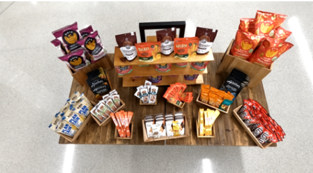

**Imagen 2:**  
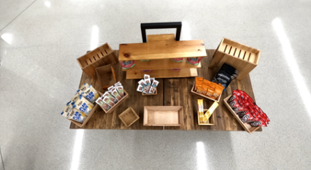

---

**Resultado del Análisis y Comparación:**  

Para comparar y contrastar el nivel de stock de las dos imágenes:

### Comparación:
1. **Primera Imagen**:
   - Presenta una variedad completa de productos.
   - Todos los estantes y espacios están ocupados, lo que indica un stock completo.
   - La disposición es ordenada y atractiva, con productos claramente visibles.

2. **Segunda Imagen**:
   - Muestra un stock significativamente reducido.
   - Hay varios espacios vacíos en los estantes y mesas, lo que sugiere que muchos productos han sido vendidos o no están disponibles.
   - La variedad de productos es menor en comparación con la primera imagen.

### Estimación del Nivel de Stock:
- **Primera Imagen**: 100%
- **Segunda Imagen**: 40%

La segunda imagen muestra un nivel de stock considerablemente más bajo, con varios espacios vacíos y menos productos en general.


In [ ]:
import cv2
import base64
import os
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI
from langchain.schema import HumanMessage, SystemMessage
import httpx
from IPython.display import display, Markdown

# 1. Cargar modelo y credenciales
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

llm = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0,
    seed=42,
    api_key=api_key,
    http_client=httpx.Client(verify=False)
)

# Función para codificar imagen
def encode_image(image_path):
    """Codifica una imagen a base64."""
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

# Función para analizar dos imágenes
def analyze_two_images(image_path1, image_path2):
    """Analiza y compara dos imágenes."""
    b64_img1 = encode_image(image_path1)
    b64_img2 = encode_image(image_path2)

    messages = [
        SystemMessage(content="Eres un asistente que analiza y compara imágenes."),
        HumanMessage(content=[
            {"type": "text", "text": "Primero compare y contraste el nivel de stock de las dos imágenes. Luego, genere una estimación del nivel de stock para cada imagen en una escala del 0 al 100 %."
            "La primera imagen tiene un stock del 100%"},
            {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{b64_img1}"}},
            {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{b64_img2}"}}
        ])
    ]

    response = llm.invoke(messages)
    return response.content

# ============================
# Rutas de las imágenes
# ============================
image1_path = "../public/vllm_stock_1.png"
image2_path = "../public/vllm_stock_2.png"

# ============================
# 2. Analizar y comparar imágenes
# ============================
comparison_text = analyze_two_images(image1_path, image2_path)

# ============================
# 3. Mostrar resultados en Markdown
# ============================
b64_img1_md = encode_image(image1_path)
b64_img2_md = encode_image(image2_path)

markdown_content = f"""
# Comparación de Imágenes

**Imagen 1:**  
<img src="data:image/png;base64,{b64_img1_md}" width="400"/>

**Imagen 2:**  
<img src="data:image/png;base64,{b64_img2_md}" width="400"/>

---

**Resultado del Análisis y Comparación:**  

{comparison_text}
"""

display(Markdown(markdown_content))



# Comparación de Imagen con Texto Ideal

**Imagen Analizada:**  
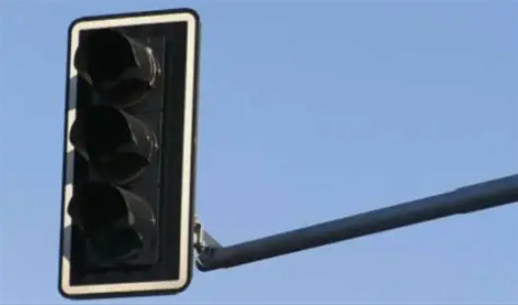

**Descripción Ideal:**  
La imagen de esta escena ideal es que almenos uno de los colores de los semaforos debe estar encendido.

---

**Resultado del Análisis:**  

La imagen muestra un semáforo con las luces apagadas, lo que no cumple con la descripción ideal que indica que al menos uno de los colores debe estar encendido. Por lo tanto, la imagen está bastante alejada de la descripción ideal.


In [ ]:
import cv2
import base64
import os
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI
from langchain.schema import HumanMessage, SystemMessage
import httpx
from IPython.display import display, Markdown

# 1. Cargar modelo y credenciales
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

llm = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0,
    seed=42,
    api_key=api_key,
    http_client=httpx.Client(verify=False)
)

# Función para codificar imagen
def encode_image(image_path):
    """Codifica una imagen a base64."""
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

# Función para comparar imagen con texto ideal
def analyze_image_vs_text(image_path, ideal_text):
    """Compara una imagen con la descripción textual del estado ideal."""
    b64_img = encode_image(image_path)

    messages = [
        SystemMessage(content="Eres un asistente que analiza imágenes y las compara con una descripción ideal."),
        HumanMessage(content=[
            {"type": "text", "text": f"Compara esta imagen con la descripción ideal y evalúa qué tan cercana está:"},
            {"type": "text", "text": f"Ideal: {ideal_text}"},
            {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{b64_img}"}}
        ])
    ]

    response = llm.invoke(messages)
    return response.content

# Ruta de la imagen y descripción ideal
image_path = "../public/vllm_semaforo.png"
ideal_description = "La imagen de esta escena ideal es que almenos uno de los colores de los semaforos debe estar encendido."

# 2. Analizar comparación
analysis_text = analyze_image_vs_text(image_path, ideal_description)

# 3. Mostrar resultados en Markdown
b64_img_md = encode_image(image_path)

markdown_content = f"""
# Comparación de Imagen con Texto Ideal

**Imagen Analizada:**  
<img src="data:image/png;base64,{b64_img_md}" width="400"/>

**Descripción Ideal:**  
{ideal_description}

---

**Resultado del Análisis:**  

{analysis_text}
"""

display(Markdown(markdown_content))



# Comparación de Imagen con Texto Ideal

**Imagen Analizada:**  
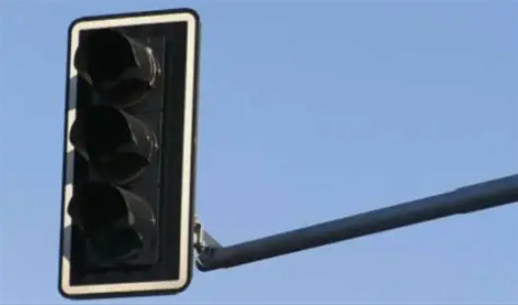

**Descripción Ideal:**  
La imagen de esta escena ideal es que todas las luces del semaforo deben estar apagadas.

---

**Resultado del Análisis:**  

La imagen muestra un semáforo con las luces apagadas, lo que coincide con la descripción ideal de que todas las luces deben estar apagadas. Por lo tanto, la imagen se ajusta perfectamente a la descripción. La evaluación de cercanía es alta, ya que cumple con el criterio establecido.


In [ ]:
# Ruta de la imagen y descripción ideal
image_path = "imagen_analizar.png"
ideal_description = "La imagen de esta escena ideal es que todas las luces del semaforo deben estar apagadas."

# 2. Analizar comparación
analysis_text = analyze_image_vs_text(image_path, ideal_description)

# 3. Mostrar resultados en Markdown
b64_img_md = encode_image(image_path)

markdown_content = f"""
# Comparación de Imagen con Texto Ideal

**Imagen Analizada:**  
<img src="data:image/png;base64,{b64_img_md}" width="400"/>

**Descripción Ideal:**  
{ideal_description}

---

**Resultado del Análisis:**  

{analysis_text}
"""

display(Markdown(markdown_content))


#### 2. Long Video Understanding
- Utilizar siempre con un video de 320x240 para optimizar el uso de tokens



<video width="640" height="480" controls>
  <source src="Fighting014_x264A.mp4" type="video/mp4">
  Tu navegador no soporta el elemento de video.
</video>


In [ ]:
import cv2
import base64
import os
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI
from langchain.schema import HumanMessage, SystemMessage
import httpx

# 1. Cargar el modelo y las credenciales
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

llm = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0,
    seed=42,  
    api_key=api_key,
    http_client=httpx.Client(verify=False)
)

# --- 2. Función para extraer frames espaciados --- (1 frame cada 5 segundos)
def extract_frames(video_path, interval_sec=5):
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_interval = int(fps * interval_sec)

    frames = []
    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            _, buffer = cv2.imencode(".jpg", frame)
            b64_frame = base64.b64encode(buffer).decode("utf-8")
            frames.append(b64_frame)

        frame_count += 1

    cap.release()
    return frames

# --- 3. Extraer frames del video ---
video_path = "Fighting014_x264A.mp4"
frames = extract_frames(video_path, interval_sec=5)

# --- 4. Crear el prompt multimodal ---
messages = [
    SystemMessage(content="Eres un asistente que entiende videos a partir de frames secuenciales."),
    HumanMessage(content=[
        {"type": "text", "text": "Describe las acciones que ocurre en este video basándote en los siguientes frames."},
        *[
            {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{frame}"}}
            for frame in frames
        ]
    ])
]

# --- 5. Llamar al modelo ---
response = llm.invoke(messages)
print(response.content)

En el video se observa una serie de interacciones en un ambiente social, probablemente en un bar o un restaurante. A continuación, se describen las acciones que ocurren a lo largo de los frames:

1. **Inicio de la fiesta**: Varias personas están bailando y socializando. Hay un ambiente animado con música y risas.

2. **Interacción entre grupos**: Se pueden ver grupos de personas que se mueven y conversan, algunos bailando en parejas.

3. **Cambio de dinámicas**: A medida que avanza el video, las interacciones se vuelven más intensas. Algunas personas parecen estar más involucradas en el baile, mientras que otras observan.

4. **Conflicto o tensión**: En ciertos momentos, se percibe un cambio en la atmósfera, donde algunos individuos parecen estar discutiendo o mostrando gestos de desacuerdo.

5. **Desenlace**: La situación parece escalar, con algunos individuos gesticulando de manera más enérgica. Se observa que algunos intentan calmar la situación, mientras otros se involucran más.

6

### 3. Structured Video Captioning

In [ ]:
import cv2
import base64
import os
import json
import markdown
from bs4 import BeautifulSoup
from datetime import datetime
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI
from langchain.schema import HumanMessage, SystemMessage
import httpx


# 1. Cargar el modelo y las credenciales
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

llm = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0,
    seed=42,  
    api_key=api_key,
    http_client=httpx.Client(verify=False)
)


# 2. Funciones auxiliares (obtener 1 frame cada 5 segundos y guardar los timestamps)
def extract_frames(video_path, interval_sec=2):
    """Extrae frames del video cada interval_sec segundos y los devuelve en base64."""
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_interval = int(fps * interval_sec)

    frames = []
    timestamps = []
    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            _, buffer = cv2.imencode(".jpg", frame)
            b64_frame = base64.b64encode(buffer).decode("utf-8")
            frames.append(b64_frame)
            timestamps.append(frame_count / fps)

        frame_count += 1

    cap.release()
    return frames, timestamps



# 3. Extraer frames del video
video_path = "Fighting014_x264A.mp4"
frames, timestamps = extract_frames(video_path, interval_sec=5)

# 4. Crear prompt para captioning estructurado
messages = [
    SystemMessage(content="Eres un asistente que entiende videos a partir de frames secuenciales."),
    HumanMessage(content=[
        {
            "type": "text",
            "text": (
                "Localize una serie de eventos de actividad en el video. "
                "Devuelve un JSON con la estructura:\n"
                "[{\"start_time\": \"mm:ss.ff\", \"end_time\": \"mm:ss.ff\", \"description\": \"...\"}, ...]\n"
                "Usa el formato 'mm:ss.ff' para los tiempos. "
                "No incluyas nada más aparte del JSON dentro de un bloque de código."
            )
        },
        *[
            {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{frame}"}}
            for frame in frames
        ]
    ])
]

# Llamar al modelo
response = llm.invoke(messages)
print("=== RAW RESPONSE ===")
print(response.content)

c:\Users\WU655GL\AppData\Local\anaconda3\envs\bootcamp\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


=== RAW RESPONSE ===
```json
[
    {"start_time": "00:00.00", "end_time": "00:10.00", "description": "Grupo de personas bailando y socializando."},
    {"start_time": "00:10.00", "end_time": "00:20.00", "description": "Interacción entre varias personas, algunos bailan."},
    {"start_time": "00:20.00", "end_time": "00:30.00", "description": "Más personas se unen al baile."},
    {"start_time": "00:30.00", "end_time": "00:40.00", "description": "Se observa un ambiente festivo con música."},
    {"start_time": "00:40.00", "end_time": "00:50.00", "description": "Algunos se mueven al ritmo de la música."},
    {"start_time": "00:50.00", "end_time": "01:00.00", "description": "Interacción entre grupos, risas y baile."},
    {"start_time": "01:00.00", "end_time": "01:10.00", "description": "Cambio de parejas en el baile."},
    {"start_time": "01:10.00", "end_time": "01:20.00", "description": "Algunos se sientan mientras otros siguen bailando."},
    {"start_time": "01:20.00", "end_time": "0

#### Visualizacion

**🕒 00:00.00 - 00:10.00:** Grupo de personas bailando y socializando.

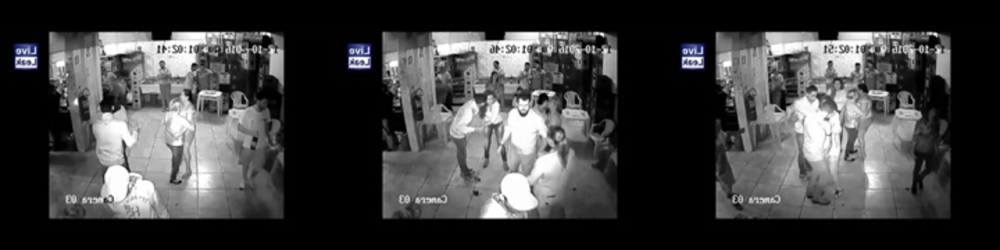

**🕒 00:10.00 - 00:20.00:** Interacción entre varias personas, algunos bailan.

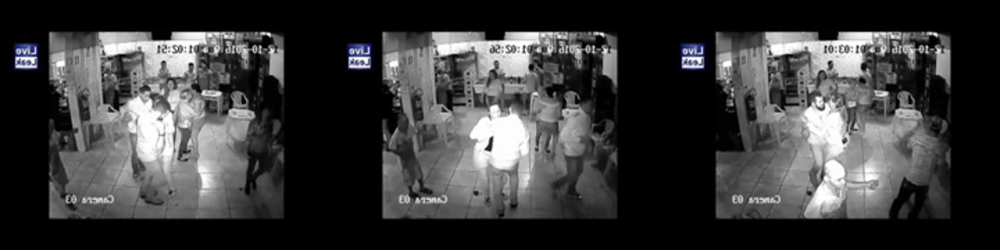

**🕒 00:20.00 - 00:30.00:** Más personas se unen al baile.

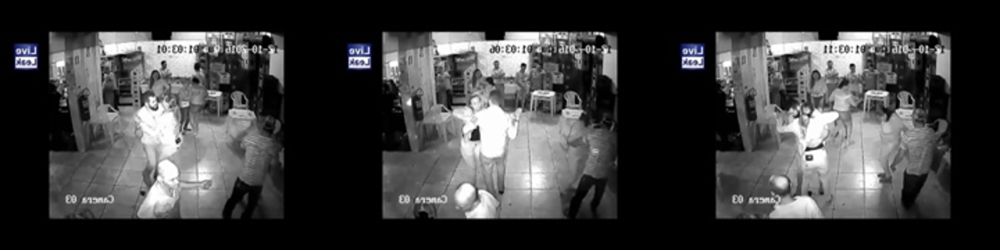

**🕒 00:30.00 - 00:40.00:** Se observa un ambiente festivo con música.

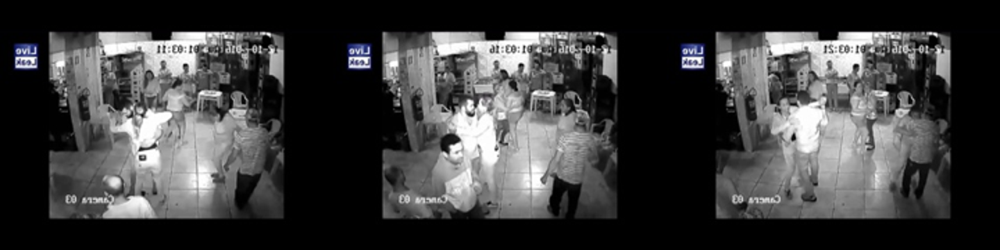

**🕒 00:40.00 - 00:50.00:** Algunos se mueven al ritmo de la música.

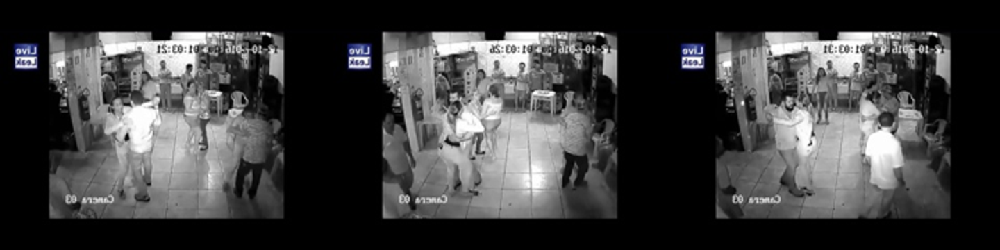

**🕒 00:50.00 - 01:00.00:** Interacción entre grupos, risas y baile.

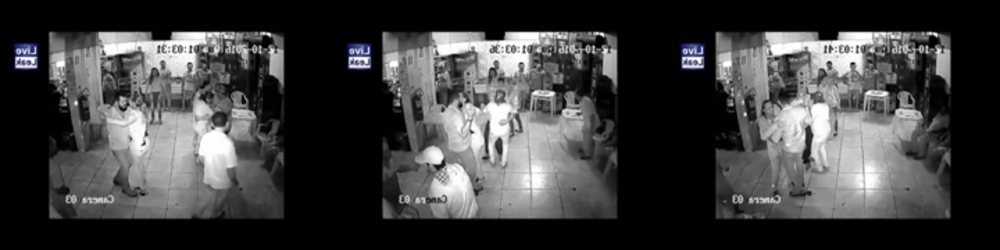

**🕒 01:00.00 - 01:10.00:** Cambio de parejas en el baile.

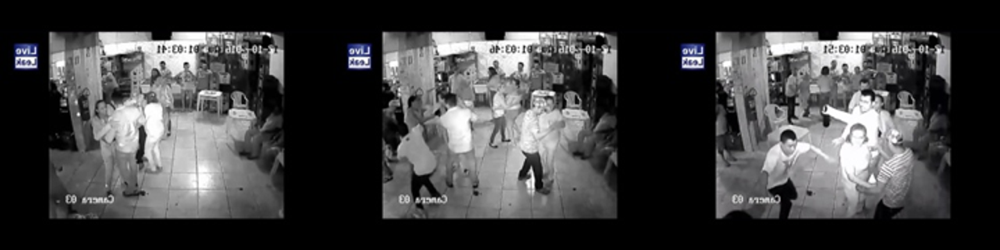

**🕒 01:10.00 - 01:20.00:** Algunos se sientan mientras otros siguen bailando.

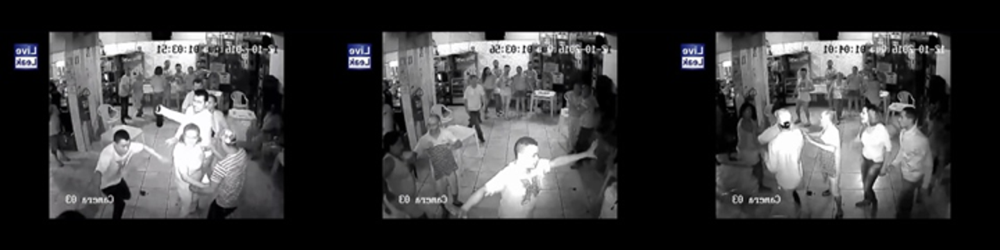

**🕒 01:20.00 - 01:30.00:** Se observa un pequeño conflicto entre algunos.

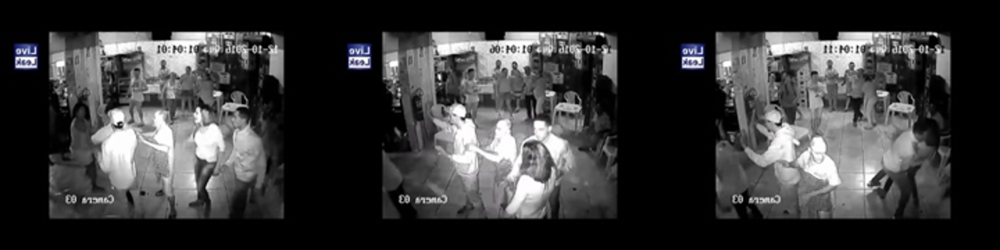

**🕒 01:30.00 - 01:40.00:** Las personas intentan calmar la situación.

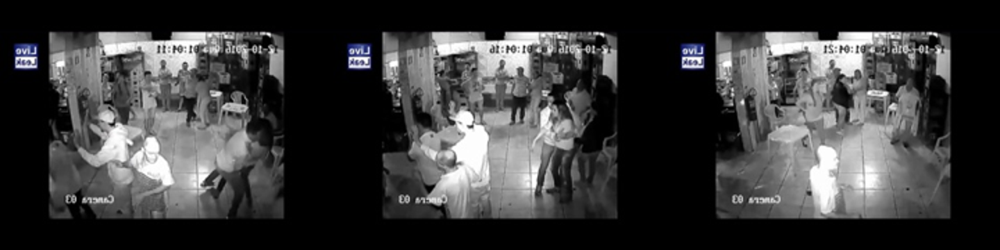

**🕒 01:40.00 - 01:50.00:** Se reanuda el baile tras el conflicto.

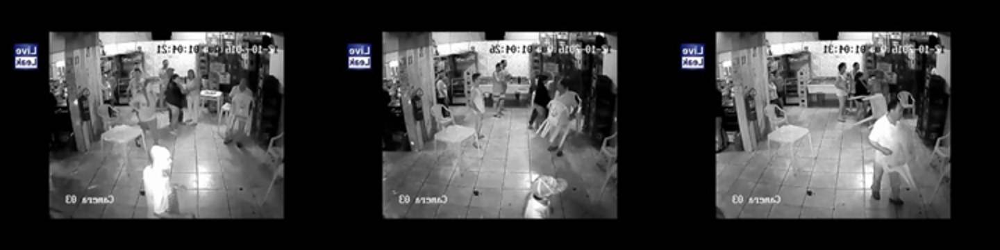

**🕒 01:50.00 - 02:00.00:** Las personas se agrupan nuevamente para bailar.

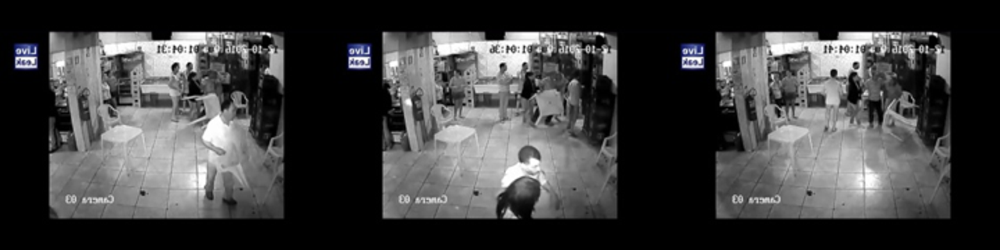

**🕒 02:00.00 - 02:10.00:** Algunos se retiran mientras otros siguen en la fiesta.

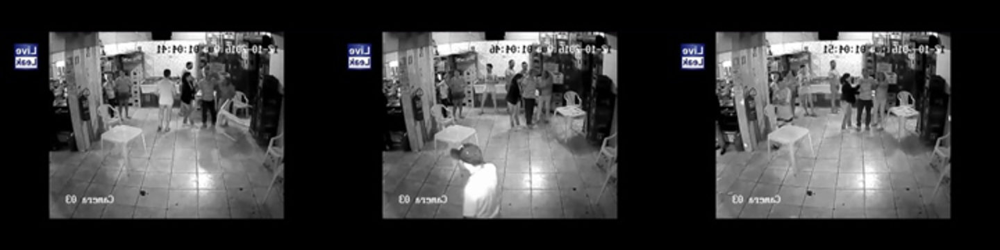

**🕒 02:10.00 - 02:20.00:** Se observa un ambiente más tranquilo.

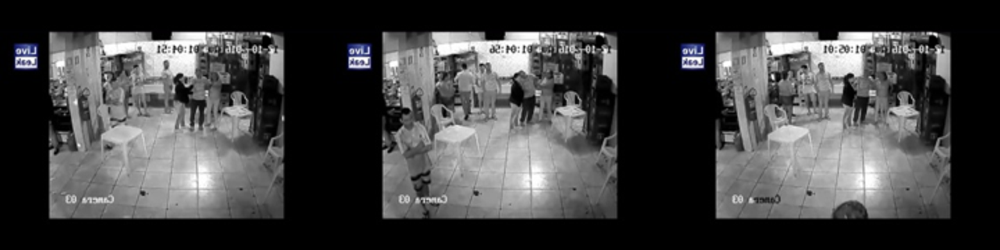

**🕒 02:20.00 - 02:30.00:** Las personas comienzan a recoger las sillas.

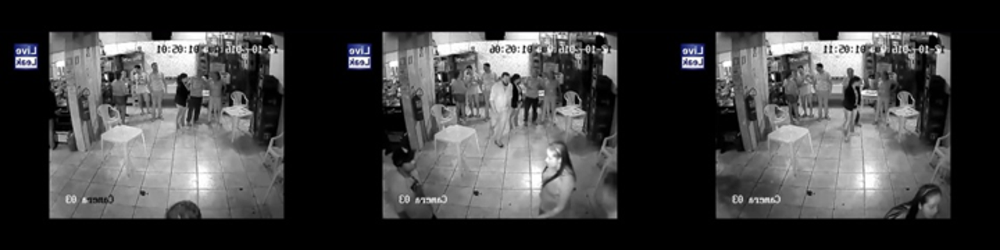

**🕒 02:30.00 - 02:40.00:** Se termina la fiesta y las personas se despiden.

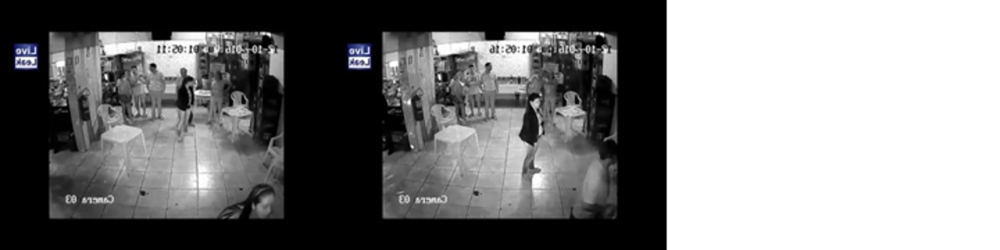

In [ ]:
from IPython.display import display, Markdown
from PIL import Image
import numpy as np
import base64

def create_image_grid(frames_b64, num_columns=6, thumb_size=(120, 90)):
    """Crea una grilla de imágenes a partir de frames en base64."""
    images = []
    for f in frames_b64:
        arr = np.frombuffer(base64.b64decode(f), np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        pil_img = Image.fromarray(img).resize(thumb_size)
        images.append(pil_img)

    rows = (len(images) + num_columns - 1) // num_columns
    grid_width = num_columns * thumb_size[0]
    grid_height = rows * thumb_size[1]

    grid = Image.new("RGB", (grid_width, grid_height), "white")

    for i, im in enumerate(images):
        x = (i % num_columns) * thumb_size[0]
        y = (i // num_columns) * thumb_size[1]
        grid.paste(im, (x, y))

    return grid


def parse_json(response_text):
    """Extrae JSON del texto con formato markdown devuelto por el modelo."""
    html = markdown.markdown(response_text, extensions=['fenced_code'])
    soup = BeautifulSoup(html, 'html.parser')
    json_text = soup.find('code').text
    return json.loads(json_text)


def time_to_seconds(time_str):
    """Convierte mm:ss.ff a segundos float."""
    time_obj = datetime.strptime(time_str, '%M:%S.%f')
    return time_obj.minute * 60 + time_obj.second + time_obj.microsecond / 1_000_000

# Procesar JSON devuelto y mostrar captions + imágenes
data = parse_json(response.content)

for item in data:
    start_time = item["start_time"]
    end_time = item["end_time"]
    description = item["description"]

    # Mostrar caption
    display(Markdown(f"**🕒 {start_time} - {end_time}:** {description}"))

    # Convertir a segundos
    start_sec = time_to_seconds(start_time)
    end_sec = time_to_seconds(end_time)

    # Seleccionar frames
    current_frames = [
        frame for frame, ts in zip(frames, timestamps)
        if start_sec <= ts <= end_sec
    ]

    # Mostrar grilla si hay frames
    if current_frames:
        grid = create_image_grid(current_frames, num_columns=3,  thumb_size=(240, 180))
        w, h = grid.size
        display(grid.resize((w*2, h*2)))

In [30]:
response.usage_metadata

{'input_tokens': 272237,
 'output_tokens': 769,
 'total_tokens': 273006,
 'input_token_details': {'audio': 0, 'cache_read': 0},
 'output_token_details': {'audio': 0, 'reasoning': 0}}